# QuantumSim - Noise and Bloch Sphere
Author: Nico Kuijpers<br>
Date: July 15, 2024

In this notebook we introduce the Bloch sphere and show how animations can be created using multiple Bloch spheres each representing the quantum state of one qubit.

We also show how the evolution of quantum states of a noisy circuit can be compared to their evolution in the ideal situation. Animations can be saved to video-files (mp4) for later use.

Import the QuantumSim code.

In [1]:
from quantumsim import *

## QuTiP - Quantum Toolbox in Python

QuTiP is open-sourse software for simulation and visualisation of the dynamics of open quantum systems. 
In QuantumSim, QuTiP is used for the visualisation of quantum states and density matrices.

See: https://qutip.org/

QuTiP can be installed by

pip install qutip

In [2]:
from qutip import Bloch, Qobj

## Bloch Sphere

The Bloch sphere can be used to visualise the quantum state of a qubit. 
As we have seen before, a single qubit can be in a superpostion of two basis states, denoted by $|0\rangle$ and $|1\rangle$. 
The quantum state $|\psi\rangle$ of a single qubit in super position can be represented as

$|\psi\rangle = \alpha|0\rangle + \beta|1\rangle$,

where $\alpha$ is a complex number representing the probability that the qubit would be in state $|0\rangle$ and 
$\beta$ is a complex number representing the probability that the qubit would be in state $|1\rangle$.
To ensure that the total probalibility is equal to $1$, the coefficients $\alpha$ and $\beta$ should satisfy the
normalization condition, i.e.,

$|\alpha|^2 + |\beta|^2 = 1$.

Here, $|\alpha|$ and $|\beta|$ represent the magnitude (or absolute value) of probability amplitudes $\alpha$ and $\beta$, respectively.
The square of the magnitude represents the probability of measuring the qubit to be in the corresponding basis state.

The Bloch sphere is a sphere in 3D space with the center in the origin $(0,0,0)$ and radius $1$. States $|0\rangle$ and $|1\rangle$ are 
located at the north pole $(0,0,1)$ and south pole $(0,0,-1)$, respectively. 

Any quantum state $|\psi\rangle$ can be represented as a point on the Bloch sphere or as a vector from the origin to that point by $\theta$ and $\phi$
defined by

$|\psi\rangle = \text{cos}\frac{\theta}{2} |0\rangle + e^{i \phi} \text{sin}\frac{\theta}{2} |1\rangle$, 

where $\theta$, $0 \leq \theta \leq \pi$, is the angle with the $z$-axis and $\phi$, $0 \leq \phi \leq 2\pi$, the angle with the $x$-axis.

Under the assumption that $\langle\psi|\psi\rangle = 1$, i.e., the normalization condition, $\theta$ and $\phi$ represent a point on the Bloch sphere.

Below, the Bloch sphere is shown for qubit state $|0\rangle$ using Bloch and Qobj from QuTiP.


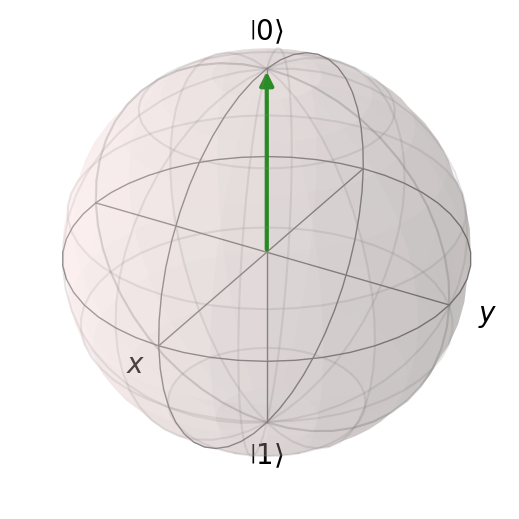

In [3]:
import numpy as np

# Define the quantum state |ψ⟩ = α|0⟩ + β|1⟩
alpha = 1
beta = 0

# Normalize the quantum state if needed
norm = np.sqrt(np.abs(alpha)**2 + np.abs(beta)**2)
alpha /= norm
beta /= norm

# Define the quantum state
psi = np.array([alpha, beta])

# Create a Qobj for the quantum state
psi_qobj = Qobj(psi)

# Initialize the Bloch sphere
b = Bloch()

# Add the state vector to the Bloch sphere
b.add_states(psi_qobj)

# Render the Bloch sphere
b.show()

Using QuTiP it is also possible to draw a vector $(x,y,z)$. 
Below, the Bloch sphere is shown with vector $(0,0,1)$ using Bloch from QuTiP. In this case, we do not need Qobj from QuTiP.

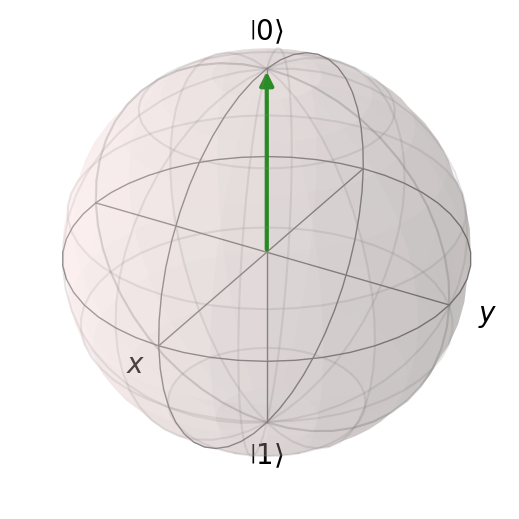

In [4]:
# Define the vector (x,y,z)
x = 0
y = 0
z = 1

# Normalize the vector if needed
norm = np.sqrt(np.abs(x)**2 + np.abs(y)**2 + np.abs(z)**2)
x /= norm
y /= norm
z /= norm

# Define the state vector
state_vector = np.array([x, y, z])

# Initialize the Bloch sphere
b = Bloch()

# Add the state vector to the Bloch sphere
b.add_vectors(state_vector)

# Render the Bloch sphere
b.show()

## Bloch sphere animation
Below, a function *create_animation()* is defined to create an animation of the execution of a noisy circuit compared to an ideal circuit.

Input parameters are two instances of NoisyCircuit which are assumed to have the same number of qubits and have exactly the same gate operations. The only difference is that the noisy qubit has some quantum noise and/or decoherence added.

A Bloch sphere is created for each qubit. A green vector represents the quantum state for an ideal circuit, whereas a red vector represents the corresponding quantum state in the presence of decoherence and/or quantum noise.

In QuantumSim, *create_animation()* is a function of class QuantumUtil.

In [5]:
import matplotlib.animation as animation

def create_animation(ideal_circuit:NoisyCircuit, noisy_circuit:NoisyCircuit=None):

    # Define the number of frames for the animation
    num_frames = len(ideal_circuit.get_x_measures(0))

    # Create a figure for the plot
    fig_width = 3 * ideal_circuit.N
    fig_height = 4
    fig = plt.figure()
    fig.set_size_inches(fig_width, fig_height)

    # Create a Bloch sphere object for each qubit
    b = []
    for q in range(ideal_circuit.N):
        ax = fig.add_subplot(1, ideal_circuit.N, q+1, projection='3d')
        b.append(Bloch(fig=fig, axes=ax))

    # Function to update the Bloch sphere for each frame
    def animate(i):
        for q in range(ideal_circuit.N):
            # Clear the previous vectors and points
            b[q].clear()  

            # Define the state vector for the ideal circuit
            x = ideal_circuit.get_x_measures(q)[i]
            y = ideal_circuit.get_y_measures(q)[i]
            z = ideal_circuit.get_z_measures(q)[i]
            ideal_state_vector = np.array([x, y, z])

            # Add the ideal state to the Bloch sphere
            b[q].add_vectors(ideal_state_vector)

            # Define the state vector for the noisy circuit
            if not noisy_circuit is None:
                x = noisy_circuit.get_x_measures(q)[i]
                y = noisy_circuit.get_y_measures(q)[i]
                z = noisy_circuit.get_z_measures(q)[i]
                noisy_state_vector = np.array([x, y, z])

                # Add the noisy state to the Bloch sphere
                b[q].add_vectors(noisy_state_vector)

            # Green is ideal state, red is noisy state
            b[q].vector_color = ['g', 'r']

            # Redraw the Bloch sphere
            b[q].make_sphere()  

    # Create an animation
    ani = animation.FuncAnimation(fig, animate, frames=num_frames, repeat=False)

    return ani

## Example: rotation about the x-axis
Below, we create two circuits with only one qubit. The Pauli X operation is applied 120 times. For the noisy circuit, a rotation of 3 degrees about the x-axis is applied after each Pauli X operation representing coherent noise. By plotting the $x$, $y$, and $z$ values of the qubit, it can be observed that $y$ and $z$ are different coherent noise is applied.

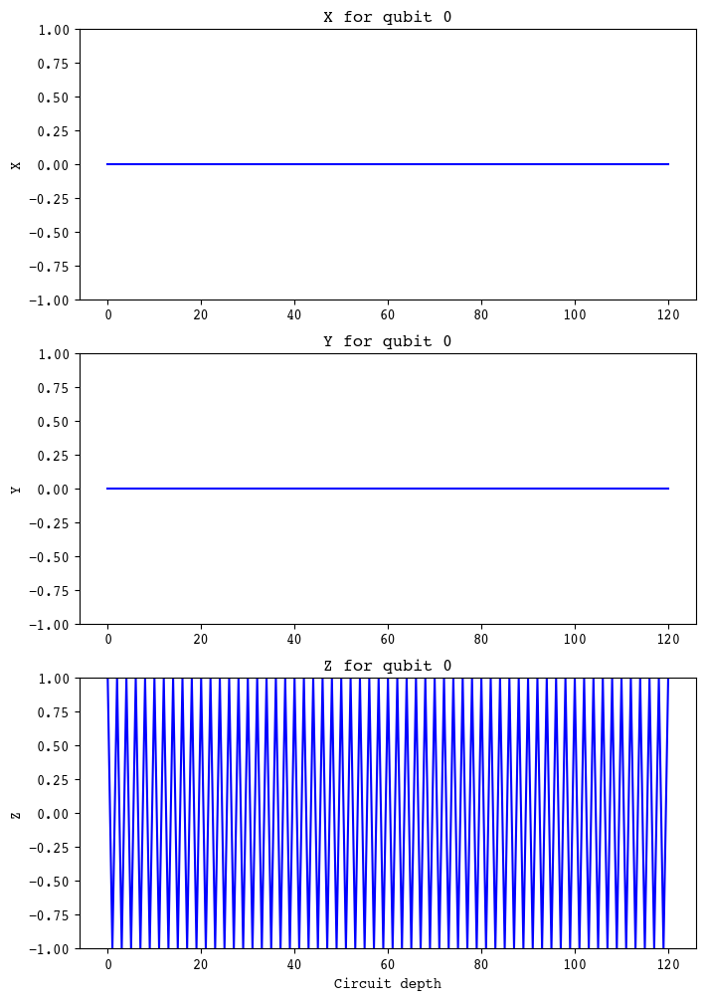

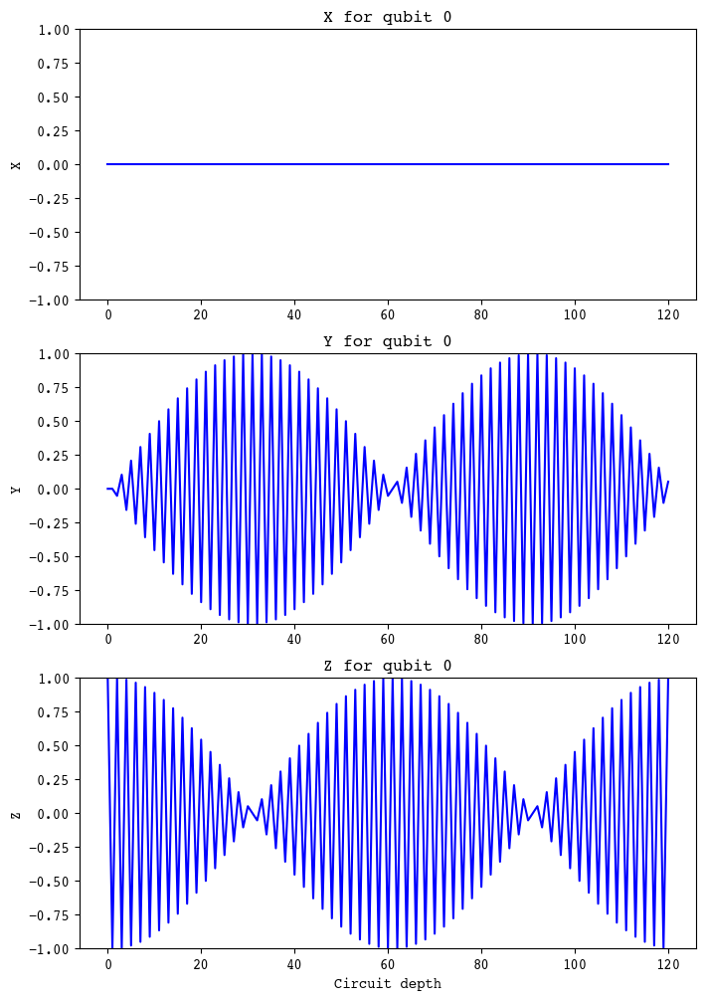

In [6]:
n = 120
noisy_circuit = NoisyCircuit(1)
for i in range(n):
    noisy_circuit.pauli_x(0)
    noisy_circuit.add_noisy_operation_coherent_x(3, 0)

ideal_circuit = noisy_circuit.create_ideal_circuit()

ideal_result = QuantumUtil.measure_circuit(ideal_circuit, nr_measurements=1000)
noisy_result = QuantumUtil.measure_circuit(noisy_circuit, nr_measurements=1000)
#QuantumUtil.histogram_of_classical_states(ideal_result)
QuantumUtil.plot_intermediate_states_per_qubit(ideal_circuit)
#QuantumUtil.histogram_of_classical_states(noisy_result)
QuantumUtil.plot_intermediate_states_per_qubit(noisy_circuit)

Below we create an animation and display it in the Jupyter notebook. Note that execution of this block of code takes time. 

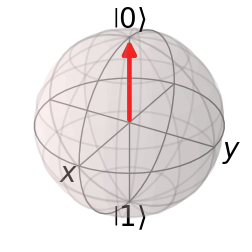

In [7]:
from IPython.display import HTML

# Create animation
ani = QuantumUtil.create_animation(ideal_circuit, noisy_circuit)

# Display the animation in the Jupyter notebook
HTML(ani.to_jshtml())

By uncommenting the code below, the animation can be saved to a video file. Execution of this block of code takes about the same time as creating the animation in the previous code block.

In [8]:
# Save the animation to video
#ani.save('bloch_sphere_animation.mp4')

## Example Quantum Fourier Transform
Below, a circuit composed of $3$ qubits is created. The qubits are brought into Fourier state $|\tilde{5}\rangle$ and an inverse QFT circuit of $3$ qubits is created. The inverse QFT circuit is appended to the first $3$-qubit circuit. After applying inverse QFT and measuring, the resulting classical state will be the binary represention of $5$, which is $|101\rangle$.

Note that an instance of class NoisyCircuit is created from the original QFT circuit. The reason is that function *create_animation()* requires one or two instances of NoisyCircuit as input (see below).

In [9]:
def create_qft(nr_qubits, number):
    circuit = Circuit(nr_qubits)
    for qubit in range(nr_qubits):
        circuit.hadamard(qubit)
    divisor = 2**(nr_qubits-1)
    for qubit in range(nr_qubits):
        circuit.phase(number*np.pi/divisor, qubit)
        divisor /= 2

    iqft_circuit = QuantumFourier.create_iqft_circuit(nr_qubits, swap_registers=True)
    circuit.append_circuit(iqft_circuit)

    # Note that the most significant qubit is qubit N-1. To obtain a classical state 
    # representing the binary representation of number, the registers are swapped again.
    circuit.swap_registers()

    return circuit.create_noisy_circuit()

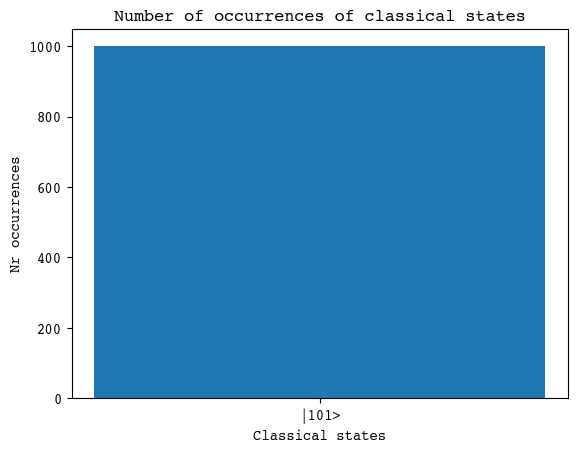

In [10]:
qft_circuit = create_qft(3, 5)
qft_result = QuantumUtil.measure_circuit(qft_circuit, 1000)
QuantumUtil.histogram_of_classical_states(qft_result)

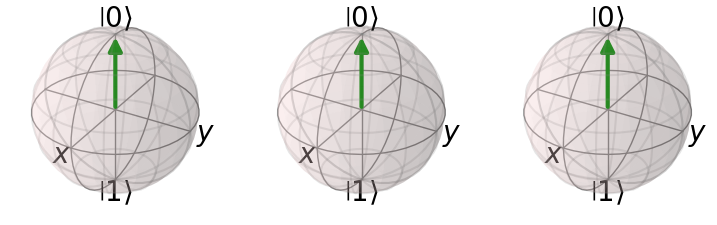

In [11]:
ani_qft = QuantumUtil.create_animation(qft_circuit)
HTML(ani_qft.to_jshtml())

Below, a circuit composed of $5$ qubits is created. The qubits are brought into Fourier state $|\tilde{19}\rangle$ and an inverse QFT circuit of $5$ qubits is created. The inverse QFT circuit is appended to the first $5$-qubit circuit. After applying inverse QFT and measuring, the resulting classical state will the binary represention of $19$, which is $|10011\rangle$.

Incoherent noisy operation for qubit 2
Incoherent noisy operation for qubit 5


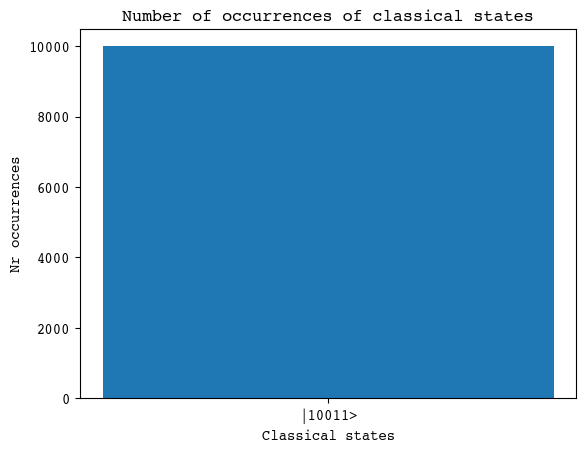

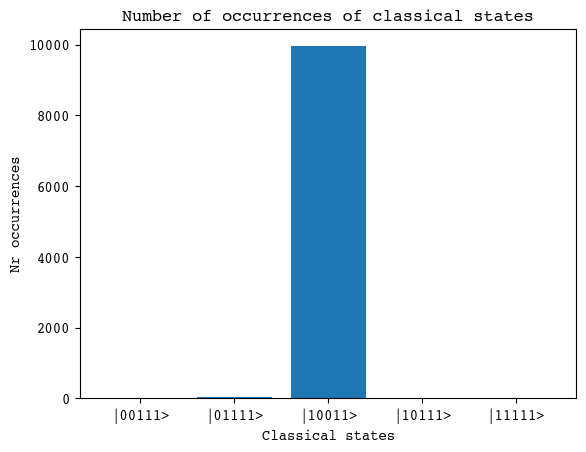

In [12]:
# Create ideal circuit
ideal_qft_circuit = create_qft(5, 19)

# Create noisy circuit from ideal circuit
noisy_qft_circuit = ideal_qft_circuit.create_noisy_circuit()
px = 0.0006
py = 0.0004
pz = 0.005
for q in [2,5]:
    print(f'Incoherent noisy operation for qubit {q}')
    noisy_qft_circuit.add_noisy_operation_incoherent(px, py, pz, q)

# Measure both circuits and show histograms of measured states
ideal_qft_result = QuantumUtil.measure_circuit(ideal_qft_circuit, 10000)
QuantumUtil.histogram_of_classical_states(ideal_qft_result)    
noisy_qft_result = QuantumUtil.measure_circuit(noisy_qft_circuit, 10000)
QuantumUtil.histogram_of_classical_states(noisy_qft_result)

Below, an animation using $5$ Bloch spheres is created. Green arrows represent the quantum state of the ideal circuit and red arrows the quantun state of the noisy circuit.

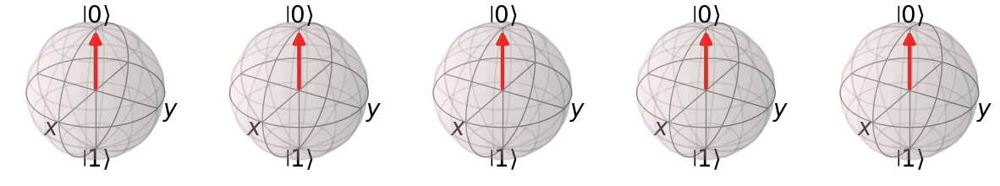

In [13]:
ani_qft_noisy = QuantumUtil.create_animation(ideal_qft_circuit, noisy_qft_circuit)
HTML(ani_qft_noisy.to_jshtml())

Below plots are shown for intermediate $x$, $y$, and $z$ values. Blue lines are the values for the ideal circuit and red lines for the noisy circuit.

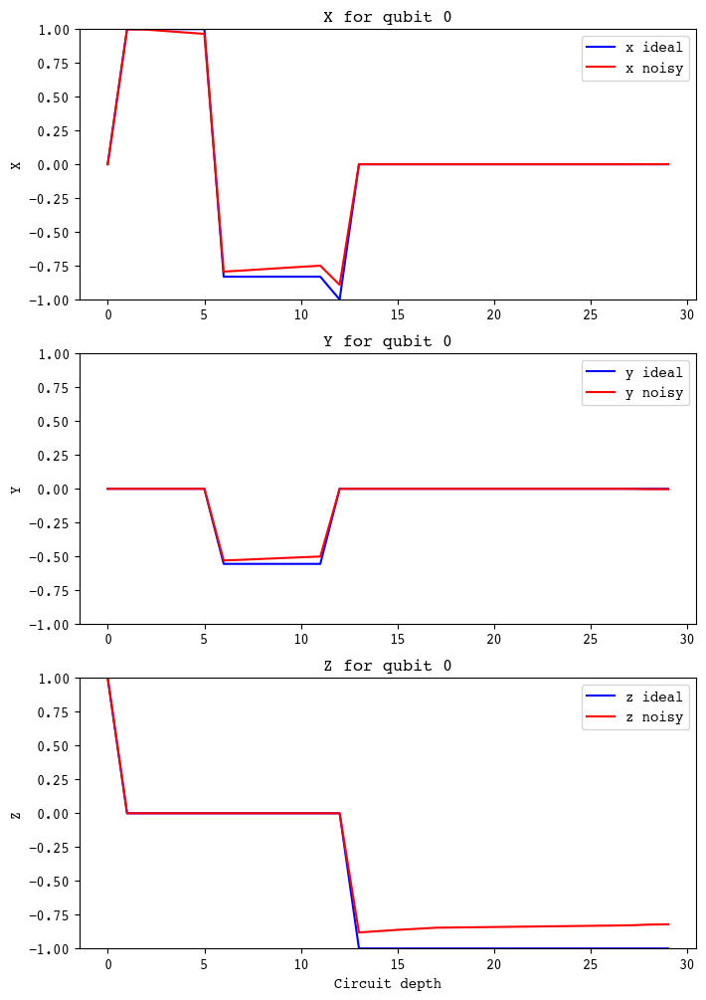

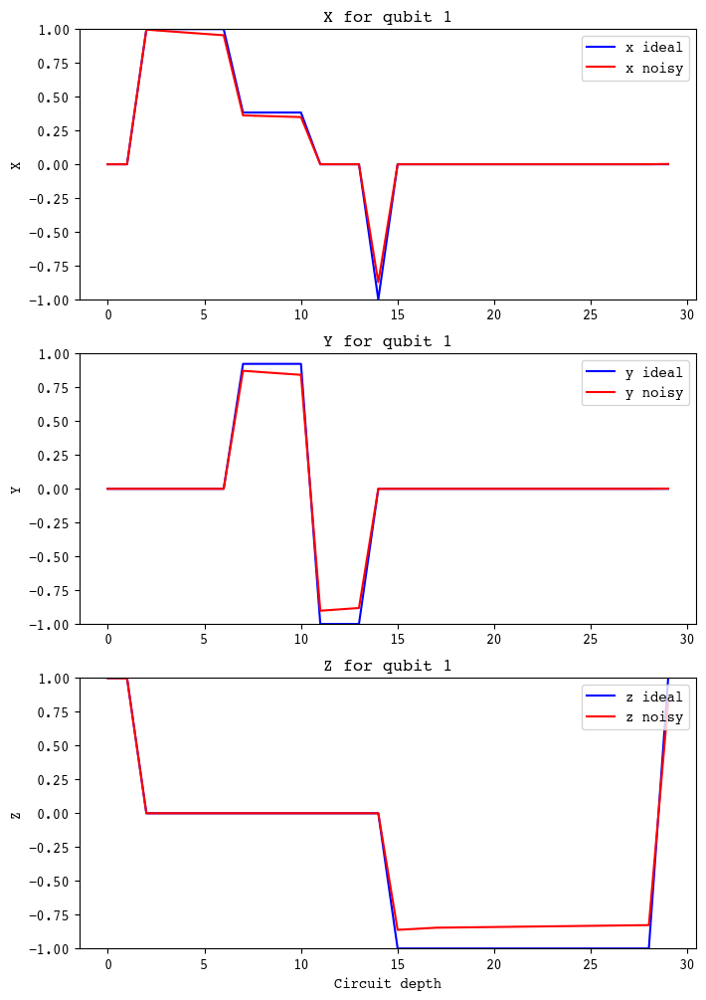

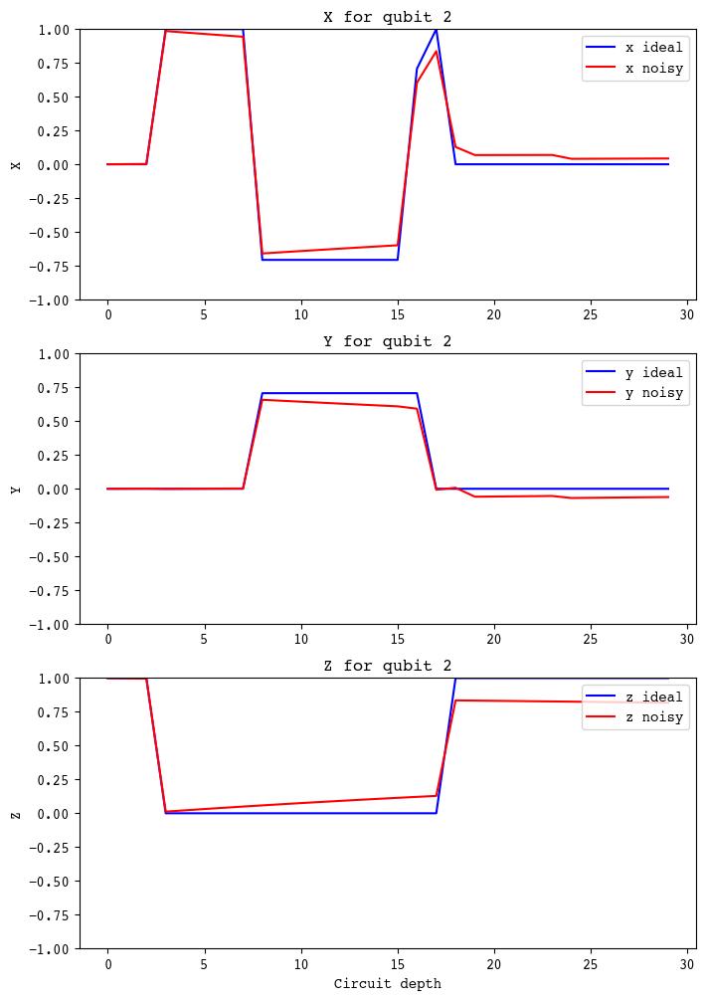

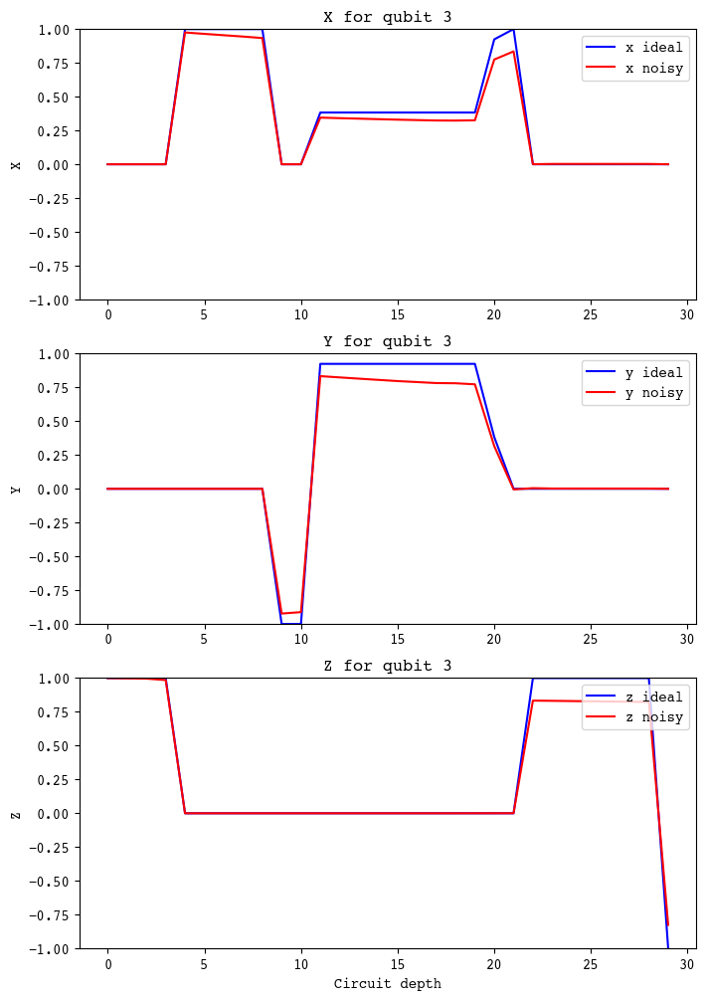

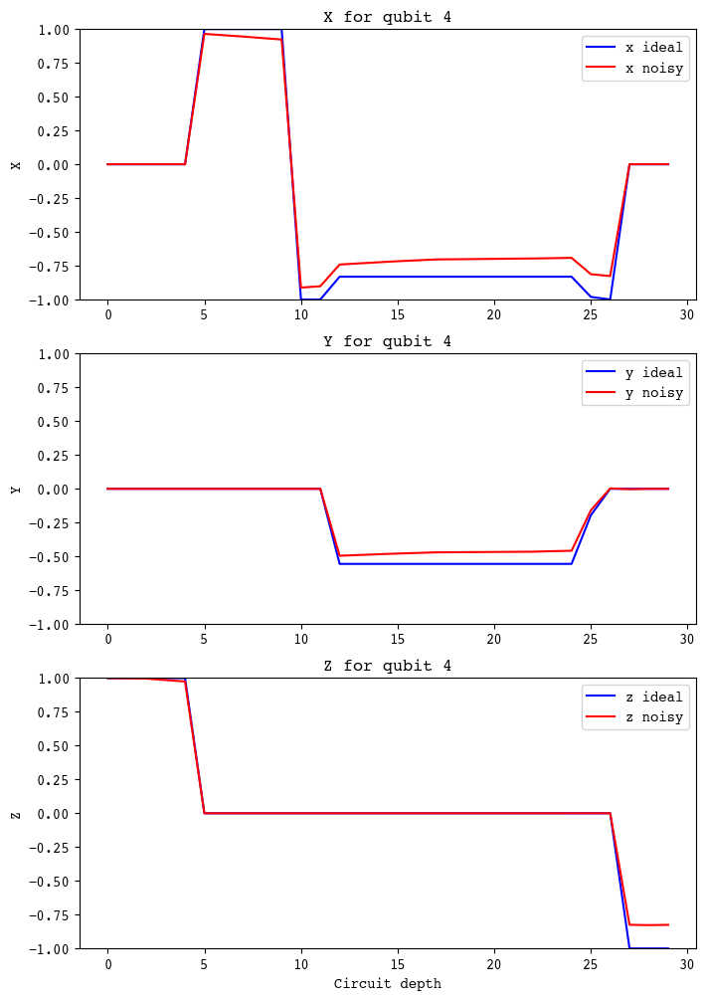

In [14]:
QuantumUtil.plot_intermediate_states_per_qubit(ideal_qft_circuit, noisy_qft_circuit)

By uncommenting the code below, the animation can be saved to a video file. Execution of this block of code takes about the same time as creating the animation in the previous code block.

In [15]:
# Save the animation to video
#ani_qft_noisy.save('bloch_sphere_animation_fourier.mp4')